In [ ]:
from pathlib import Path
from openslide import OpenSlide
import PIL.Image as Image
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import warp
import cv2
import rasterio
from rasterio import features
import shapely
from shapely.geometry import Point, Polygon
from shapely.affinity import affine_transform
from shapely.ops import unary_union
from shapely import wkt
from PIL import ImageDraw
from cytomine.models import TermCollection, AnnotationTerm, Annotation, AnnotationCollection
from cytomine import Cytomine

In [ ]:
host = "http://localhost-core"
public_key = "a0d58403-b8bc-4f33-b89b-fc42b1ad05e0"
private_key = "df7e6610-63cb-4d14-96ad-06c6e6a91b92"

In [ ]:
data = Path("/data/DeepLearning/SCHWOB_Robin/APRIORICS-prelim/")

In [ ]:
slide1 = OpenSlide(str(data/"slides/21T035390-03_HE.svs"))
slide2 = OpenSlide(str(data/"slides/21T035390-03_ERG-Caldesmon.svs"))

In [ ]:
bbox = 17000, h-130000, 61000, h-92000

In [ ]:
thumb = slide1.get_thumbnail((5000, 5000))
dsr = w / thumb.width

In [ ]:
list(map(lambda x: int(x/dsr), bbox))

[426, 1740, 1529, 2693]

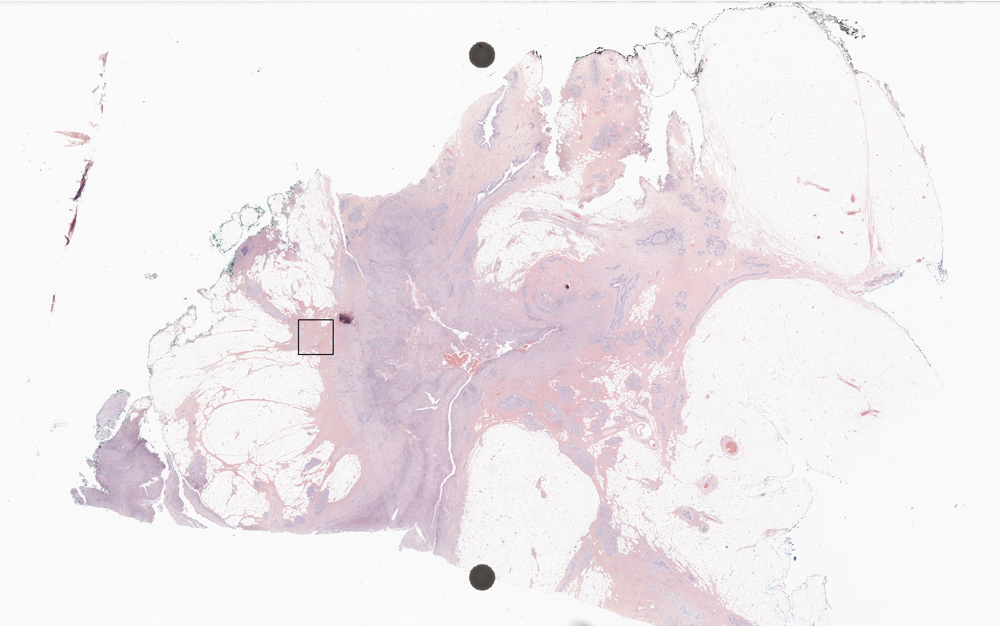

In [ ]:
w, h = slide1.dimensions
thumb = slide1.get_thumbnail((3000, 3000))
draw = ImageDraw.Draw(thumb)
dsr = w / thumb.width
x, y = 42000, 45000
xy = np.array([x, y, x+5000, y+5000])
draw.rectangle((xy/dsr).astype(int).tolist(), outline="black", width=3)
thumb

In [ ]:
with open("/data/DeepLearning/SCHWOB_Robin/APRIORICS-prelim/CF_APRIORICS-prelim_0001-06-HE_all.wkt", "r") as f:
    locs = f.read().rstrip().split("\n")
polygons = [wkt.loads(loc) for loc in locs]
polygons = unary_union(polygons)

In [ ]:
polygons

In [ ]:
with open("/data/DeepLearning/SCHWOB_Robin/APRIORICS-prelim/CF_APRIORICS-prelim_0001-01-HE_bis.wkt", "r") as f:
    polygons = wkt.loads(f.read())

In [ ]:
with open("/data/DeepLearning/SCHWOB_Robin/APRIORICS-prelim/CF_APRIORICS-prelim_0001-01-HE_all.wkt", "w") as f:
    f.write("\n".join([polygons.wkt for polygons in all_polygons]))
with open("/data/DeepLearning/SCHWOB_Robin/APRIORICS-prelim/CF_APRIORICS-prelim_0001-01-HE.wkt", "w") as f:
    f.write(unary_union(all_polygons).wkt)

In [ ]:
from cytomine.models import TermCollection, ImageInstanceCollection

In [ ]:
with Cytomine(host=host, public_key=public_key, private_key=private_key) as cytomine:
    images = ImageInstanceCollection().fetch_with_filter("project", 1366)
    for image in images:
        print(image.filename)

[2021-11-02 10:33:47,903][INFO] [GET] [currentuser] CURRENT USER - 61 : admin | 200 OK
[2021-11-02 10:33:47,994][INFO] [GET] [imageinstance collection] 8 objects | 200 OK
/1635320223690/CF_APRIORICS-prelim_0001-06-HE/CF_APRIORICS-prelim_0001-06-HE.mrxs
/1635319978706/CF_APRIORICS-prelim_0001-06-CD3/CF_APRIORICS-prelim_0001-06-CD3.mrxs
/1635239651073/CF_APRIORICS-prelim_0001-07-HE/CF_APRIORICS-prelim_0001-07-HE.mrxs
/1631887484871/CF_APRIORICS-prelim_0001-07-PHH3/CF_APRIORICS-prelim_0001-07-PHH3.mrxs
/1631624750917/CF_APRIORICS-prelim_0001-01-CK19/CF_APRIORICS-prelim_0001-01-CK19.mrxs
/1631624539255/CF_APRIORICS-prelim_0001-01-HE/CF_APRIORICS-prelim_0001-01-HE.mrxs
/1631613874241/CF_APRIORICS-prelim_0001-08-EMD/CF_APRIORICS-prelim_0001-08-EMD.mrxs
/1631613239452/NVA_20.027-APRX.MCK_21T8233-AE1AE3-200Di-perox20.svs


In [ ]:
with Cytomine(host=host, public_key=public_key, private_key=private_key) as cytomine:
    terms = TermCollection().fetch_with_filter("project", 1366)
    for term in terms:
        print("Term ID: {} | Name: {} | Color: {}".format(term.id, term.name, term.color))

[2021-11-04 10:59:29,717][INFO] [GET] [currentuser] CURRENT USER - 61 : admin | 200 OK
[2021-11-04 10:59:29,759][INFO] [GET] [term collection] 5 objects | 200 OK
Term ID: 642774 | Name: CK19 | Color: #DB4D0B
Term ID: 1960672 | Name: PHH3 | Color: #F0F0B9
Term ID: 2199004 | Name: CD3 | Color: #0AD93C
Term ID: 2508201 | Name: Caldesmone | Color: #F0FF07
Term ID: 2516205 | Name: Noyaux | Color: #62e9ca


In [ ]:
%%capture
with Cytomine(host=host, public_key=public_key, private_key=private_key) as cytomine:
    annotations = AnnotationCollection()
    for polygon in moved_polygons:
        annotation = Annotation(location=polygon.wkt, id_image=7344, id_project=1366)
        annotations.append(annotation)
    results = annotations.save()
    for _, (_, message) in results:
        ids = map(int, message.split()[1].split(","))
        for id in ids:
            AnnotationTerm(id_annotation=id, id_term=2516205).save()

In [ ]:
%%capture
with Cytomine(host=host, public_key=public_key, private_key=private_key) as cytomine:
    annotations = AnnotationCollection()
    annotations.image = 2507498
    annotations.showWKT = True
    annotations.showTerm = True
    annotations.fetch()
    for annotation in annotations:
        annotation.delete()

In [ ]:
polygons = unary_union([wkt.loads(annotation.location) for annotation in annotations])
polygons = shapely.affinity.affine_transform(polygons, [1, 0, 0, -1, 0, slide1.dimensions[1]])

In [ ]:
from skimage.draw import polygon2mask

In [ ]:
mask = np.array(Image.open("/home/Robin/contour_test.png").convert("L"))

In [ ]:
from scipy.spatial import ConvexHull

In [ ]:
contours, hiers = cv2.findContours(mask, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

In [ ]:
closed_contours = []
for contour, hier in zip(contours, hiers[0]):
    contour = contour.squeeze(1)
    if hier[2] > 0:
        closed_contours.append(contour)
    elif hier[3] < 0:        
        hull = ConvexHull(contour)
        closed_contours.append(contour[hull.vertices])

In [ ]:
img = cv2.drawContours(cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB), closed_contours, -1, color=(255, 0, 0))

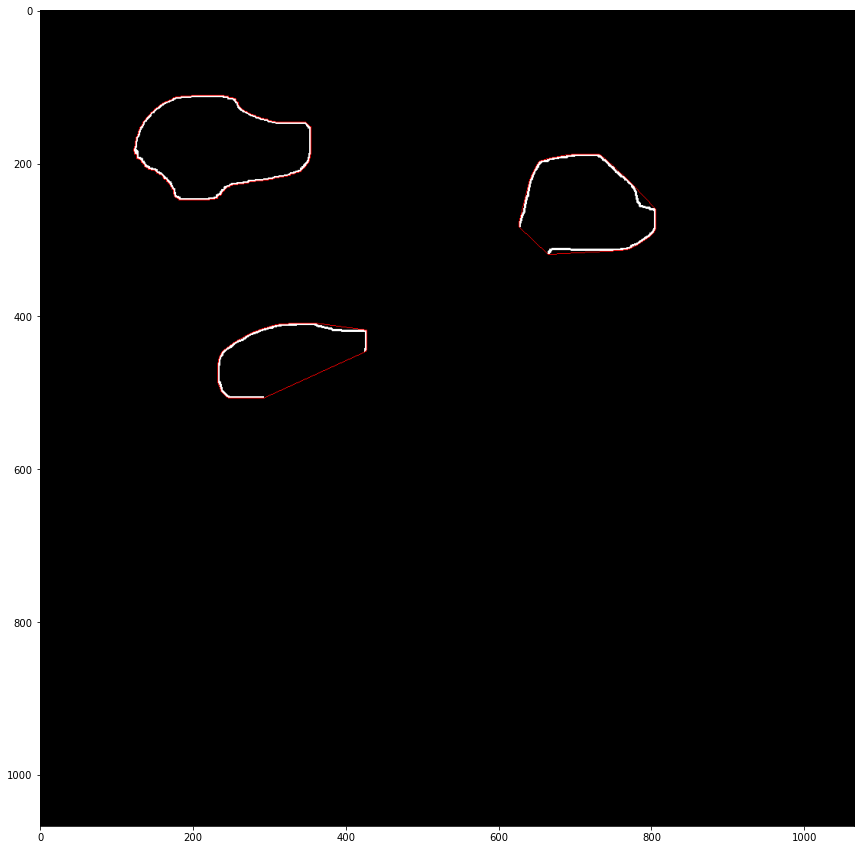

In [ ]:
plt.figure(figsize=(15, 15))
plt.imshow(img)

In [ ]:
hists = []
for polygon in polygons:
    x0, y0, x1, y1 = map(int, polygon.bounds)
    h, w = y1-y0, x1-x0
    img = slide1.read_region((x0, y0), 0, (w, h)).convert("RGB")
    polygon = shapely.affinity.translate(polygon, -x0, -y0)
    mask = polygon2mask((h, w), polygon.exterior.coords)
    hists.append(img.histogram(mask=Image.fromarray(mask)))

In [ ]:
hists = np.array(hists).sum(0).reshape(3, 256)

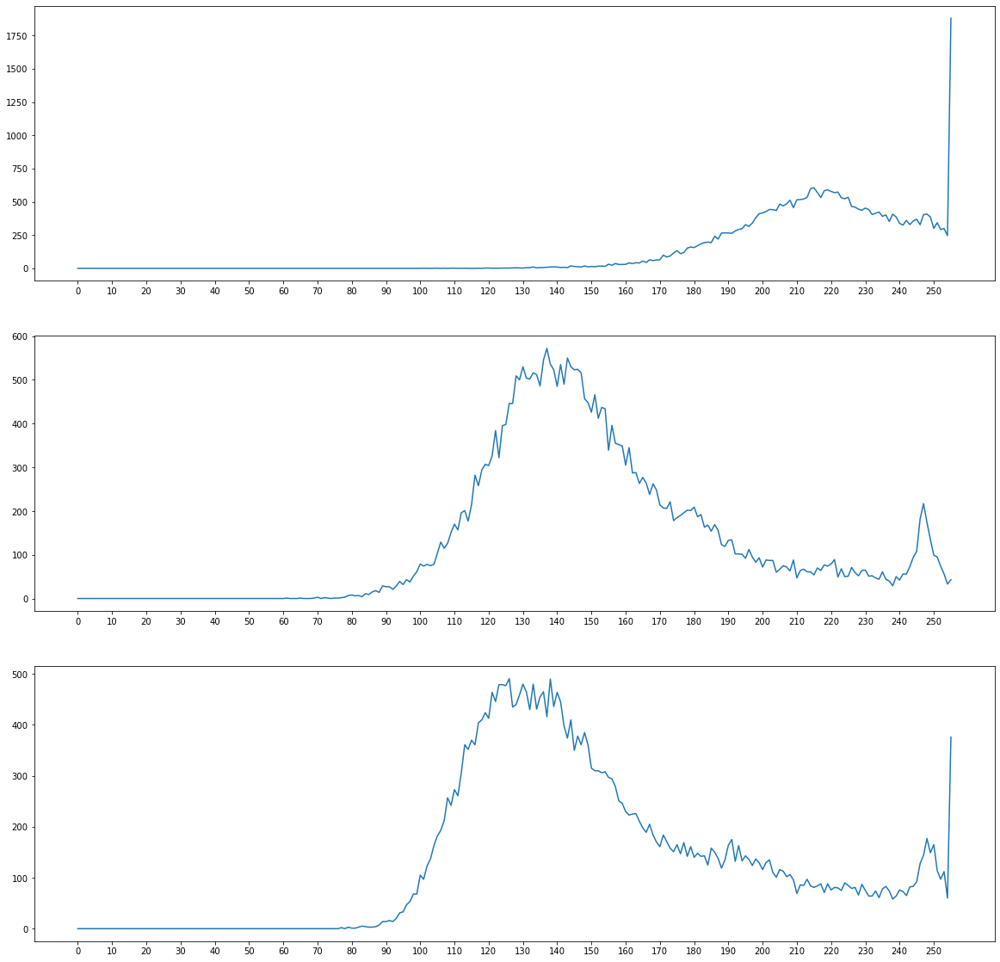

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(20, 20))
for ax, hist in zip(axs.flatten(), hists):
    ax.xaxis.set_ticks(range(0, 256, 10))
    ax.plot(hist)

In [ ]:
x, y = 32000, h-108000
size = 10000

In [ ]:
from scipy import linalg

In [ ]:
rgb_from_hed = np.array([[0.65, 0.70, 0.29],
                         [0.07, 0.99, 0.11],
                         [0.27, 0.57, 0.78]])
hed_from_rgb = linalg.inv(rgb_from_hed)

In [ ]:
hed_max = (hed_from_rgb * (hed_from_rgb > 0)).sum(0)
hed_min = (hed_from_rgb * (hed_from_rgb < 0)).sum(0)

In [ ]:
def _prepare_colorarray(arr, force_copy=False):
    arr = np.asanyarray(arr)

    if arr.shape[-1] != 3:
        raise ValueError("Input array must have a shape == (..., 3)), "
                         f"got {arr.shape}")

    return dtype.img_as_float(arr, force_copy=force_copy)

In [ ]:
from skimage.util import dtype
from skimage.color import rgb2hed

In [ ]:
reg1 = slide1.read_region((x, y), 0, (size, size))
reg1.save(data/f"patches_{size}/CF_APRIORICS-prelim_0001-07/HE/{x}_{y}_0.png")

In [ ]:
reg1_hed = rgb2hed(np.array(reg1.convert("RGB")))
reg1_hed = (reg1_hed - hed_min) / (hed_max-hed_min)
reg1_hed = (reg1_hed * 255).astype(np.uint8)
Image.fromarray(reg1_hed[:, :, 0]).save(data/f"patches_{size}/CF_APRIORICS-prelim_0001-07/HE/{x}_{y}_0_H.png")

In [ ]:
reg2 = slide2.read_region((x, y), 0, (size, size))
reg2.save(data/f"patches_{size}/CF_APRIORICS-prelim_0001-01/PHH3/{x}_{y}_0.png")

In [ ]:
reg2_hed = rgb2hed(np.array(reg2.convert("RGB")))
reg2_hed = (reg2_hed - hed_min) / (hed_max-hed_min)
reg2_hed = (reg2_hed * 255).astype(np.uint8)
Image.fromarray(reg2_hed[:, :, 0]).save(data/f"patches_{size}/CF_APRIORICS-prelim_0001-07/PHH3/{x}_{y}_0_H.png")

In [ ]:
import subprocess
import sys

In [ ]:
subprocess.run(
    [
        "HistoReg",
        "-P",
        "-F",
        "-i",
        "20000",
        "-f",
        str(data/f"patches_{size}/CF_APRIORICS-prelim_0001-07/HE/{x}_{y}_0_H.png"),
        "-m",
        str(data/f"patches_{size}/CF_APRIORICS-prelim_0001-07/PHH3/{x}_{y}_0_H.png"),
        "-o",
        str(data/"historeg_registration_output/CF_APRIORICS-prelim_0001-07"),
    ],
    universal_newlines=True,
    capture_output=True
)

CompletedProcess(args=['HistoReg', '-P', '-F', '-i', '20000', '-f', '/data/DeepLearning/SCHWOB_Robin/APRIORICS-prelim/patches_10000/CF_APRIORICS-prelim_0001-07/HE/32000_91440_0_H.png', '-m', '/data/DeepLearning/SCHWOB_Robin/APRIORICS-prelim/patches_10000/CF_APRIORICS-prelim_0001-07/PHH3/32000_91440_0_H.png', '-o', '/data/DeepLearning/SCHWOB_Robin/APRIORICS-prelim/historeg_registration_output/CF_APRIORICS-prelim_0001-07'], returncode=0, stdout='Starting...\nReading arguments...\nDone.\nCreating output and temporary directories...\nDone.\nPreprocessing...\n   Resampling source...\n   Resampling target...\n   Padding images...\n   Target done.\n   Source done.\nPreprocessing took : 206 seconds.\nRegistration...\n   Computing affine...\nExecuting with the default number of threads: 40\nNoise on image 0 component 0: fixed = 0.00916782, moving = 0.00425401\nRigid search -> Initial best: -274.782 -0.00279965 -0.0780388 0.0739248\nRigid search -> Iter 39: -399.026 0.00451224 -20.7776 -8.9984 d

In [ ]:
warp_coord = nib.load(data/f"historeg_registration_output/CF_APRIORICS-prelim_0001-08/{x}_{y}_0_registered_to_{x}_{y}_0/metrics/full_resolution/big_warp.nii.gz").get_fdata().squeeze()

In [ ]:
he = Image.open(data/f"historeg_registration_output/CF_APRIORICS-prelim_0001-07/{x}_{y}_0_H_registered_to_{x}_{y}_0_H/PNGs/full_resolution/new_target.png")

//home/DeepLearning/anaconda3/envs/pytorch/lib/python3.7/site-packages/PIL/Image.py:2837: DecompressionBombWarning: Image size (100000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


In [ ]:
ihc = Image.open(data/f"historeg_registration_output/CF_APRIORICS-prelim_0001-07/{x}_{y}_0_H_registered_to_{x}_{y}_0_H/PNGs/full_resolution/new_source.png")

In [ ]:
ihc_warped = Image.open(data/f"historeg_registration_output/CF_APRIORICS-prelim_0001-07/{x}_{y}_0_H_registered_to_{x}_{y}_0_H/PNGs/full_resolution/registeredImage.png")

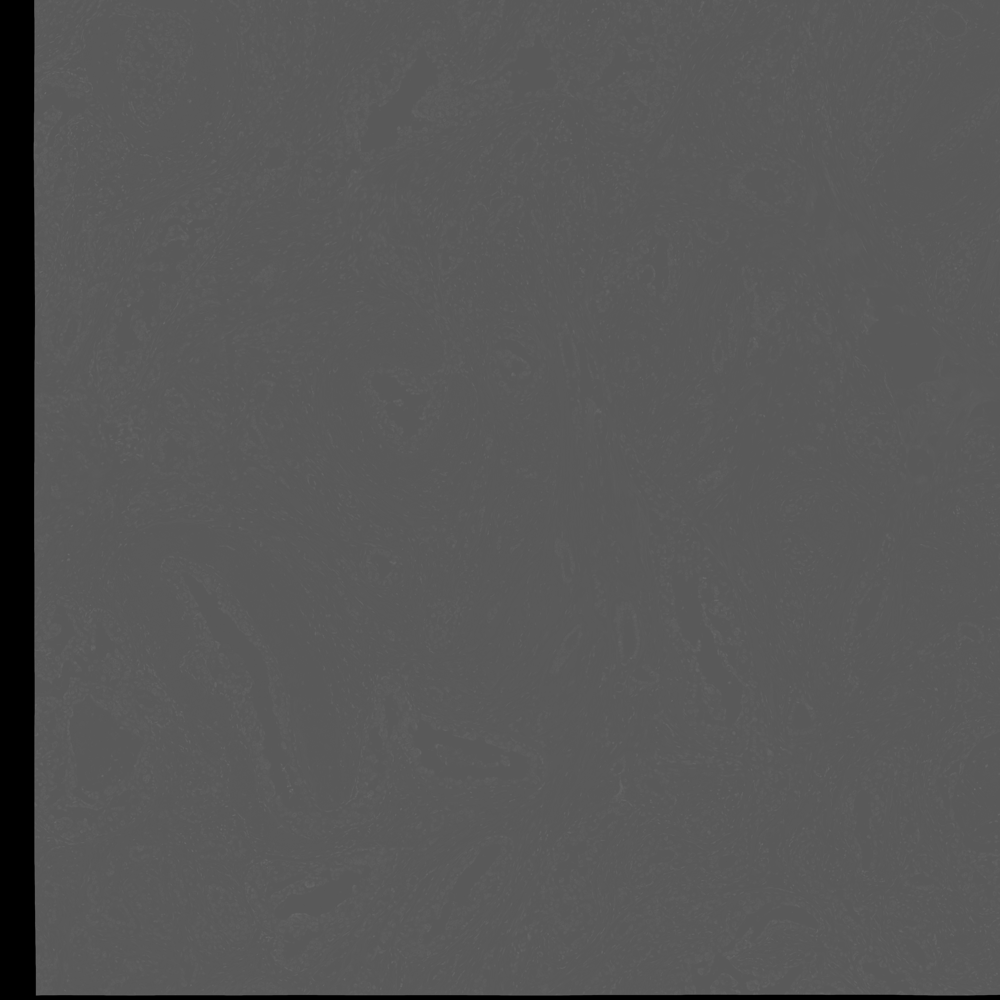

In [ ]:
ihc_warped.resize((1000, 1000))

In [ ]:
img = Image.open("/data/DeepLearning/SCHWOB_Robin/APRIORICS-prelim/historeg_registration_output/CF_APRIORICS-prelim_0001-01/32000_56000_0_H_registered_to_32000_56000_0_H/ihc_warped.png")

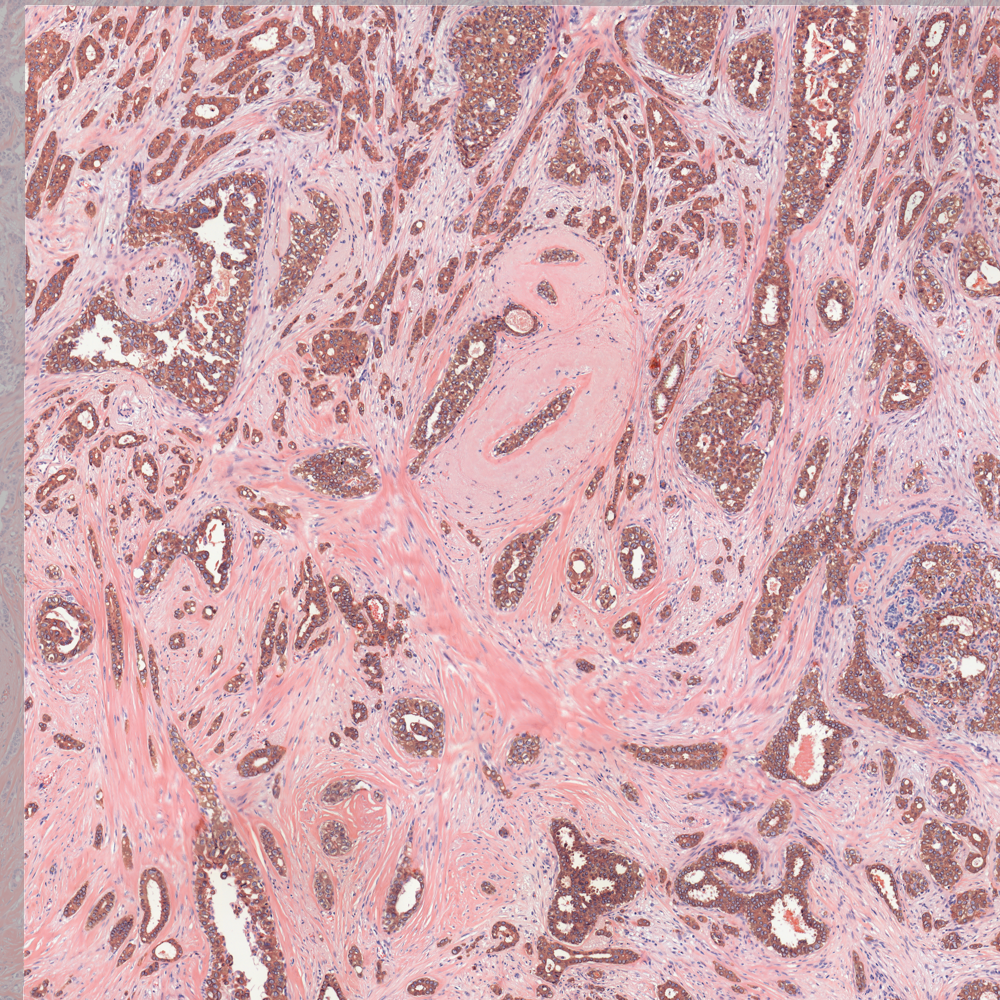

In [ ]:
Image.blend(he.resize((1000, 1000)).convert("RGBA"), img.resize((1000, 1000)).convert("RGBA"), 0.5)

In [ ]:
from skimage.morphology import remove_small_objects, remove_small_holes, binary_dilation, binary_closing
from skimage.filters import threshold_otsu, threshold_multiotsu, sobel
from skimage.segmentation import find_boundaries, watershed
from skimage.color import hed_from_rgb, rbd_from_rgb, separate_stains, rgb2hsv, rgb2gray
from skimage.transform import resize

In [ ]:
img = np.array(slide1.read_region((42000, 45000), 0, (5000, 5000)).convert("RGB"))

In [ ]:
img_e = rgb2hed(img)[:, :, 1]

In [ ]:
thr = 0.012
mask = img_e > thr

In [ ]:
mask = binary_closing(mask, selem=disk(3))
mask = remove_small_holes(mask, area_threshold=40)
mask = binary_dilation(mask, selem=disk(2))
mask = remove_small_objects(mask, min_size=40)

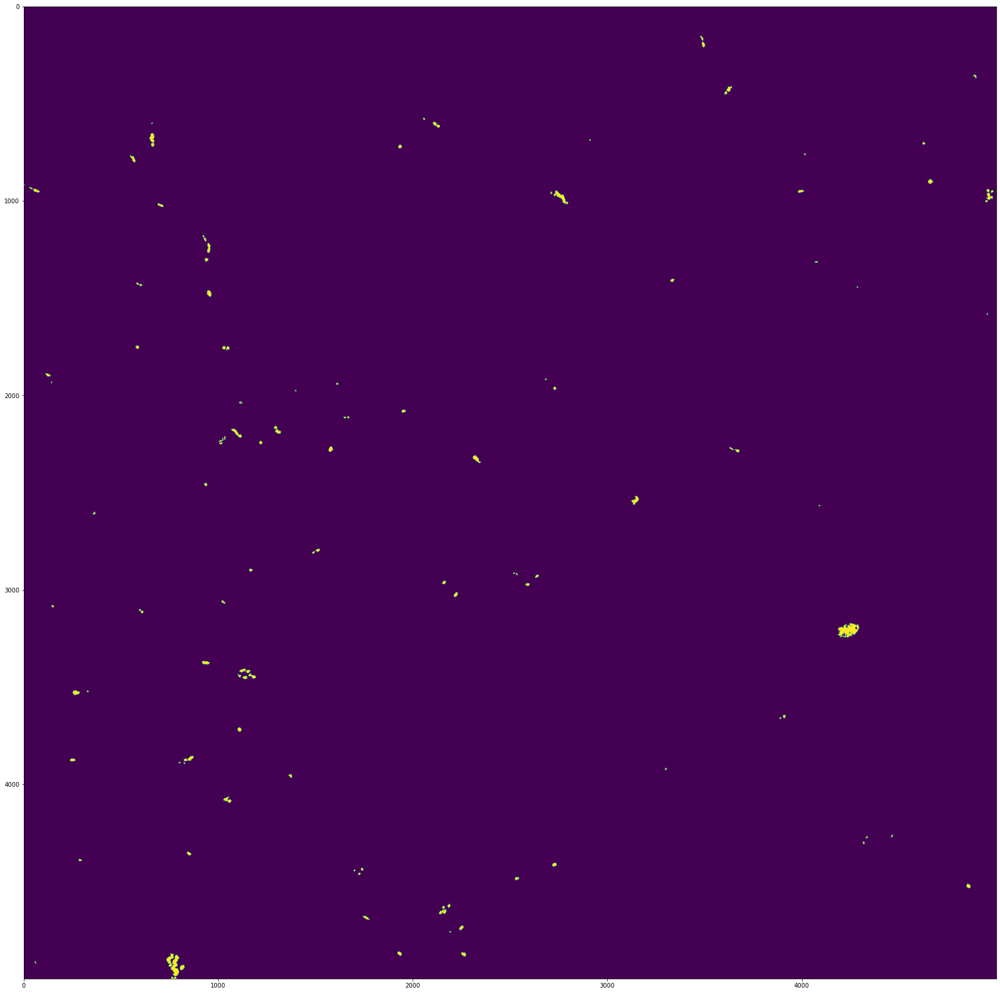

In [ ]:
plt.figure(figsize=(30, 30))
plt.imshow(mask)

In [ ]:
n = slide2.level_count

In [ ]:
res = float(slide2.properties["openslide.mpp-x"])
min_obj_size = 300
min_hole_size = 300

In [ ]:
mask = None
thr = 0
for i in range(n-2, -1, -1):
    dsr = slide2.level_downsamples[i]
    img = slide2.read_region((52000, 45000), i, (int(5000/dsr), int(5000/dsr))).convert("RGB")
    source_gray = separate_stains(img, rbd_from_rgb)[:, :, 0]
    """img_min = source_gray.min()
    img_max = source_gray.max()
    source_gray = (source_gray - img_min) / (img_max - img_min)"""
    thr = threshold_multiotsu(image=source_gray)[1]
    if mask is None:
        mask = source_gray > thr
    else:
        mask = resize(mask, source_gray.shape).astype(bool) | (source_gray > thr)
    
    mask = binary_closing(mask, selem=disk(int(np.sqrt(min_hole_size/(res*dsr*np.pi)))))
    mask = remove_small_holes(mask, area_threshold=int(min_hole_size/(res*dsr)))
    mask = remove_small_objects(mask, min_size=int(min_obj_size/(res*dsr)))    

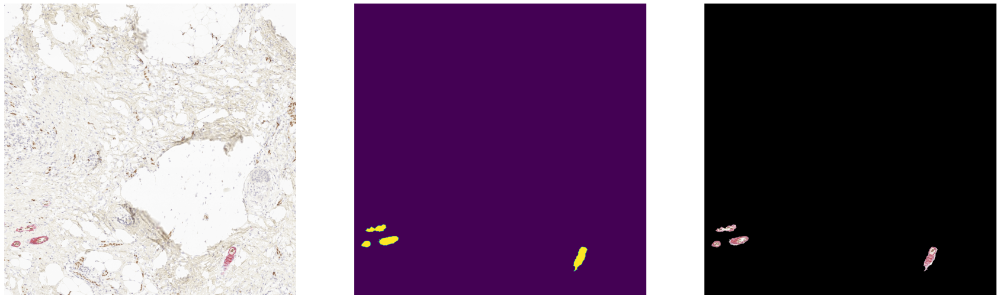

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(30, 10))
for im, ax in zip((img, mask, np.array(img)*mask[:, :, None]), axs.flatten()):
    ax.imshow(im)
    ax.axis("off")

In [ ]:
target = np.array(he.crop((500, 500, 9500, 9500)))
source = np.array(ihc_warped.crop((500, 500, 9500, 9500)))
source_gray = rgb2hed(np.array(ihc_warped.crop((500, 500, 9500, 9500))))[:, :, 2]

In [ ]:
n = 10
r = 10
y, x = np.ogrid[-n:n+1, -n:n+1]

In [ ]:
selem = x**2 + y**2 <= r**2

In [ ]:
thr = threshold_otsu(image=source_gray, hist=None)
mask = source_gray > thr
mask = remove_small_objects(mask, min_size=1000)
mask = binary_closing(mask, selem=selem)
mask = remove_small_holes(mask, area_threshold=5000)

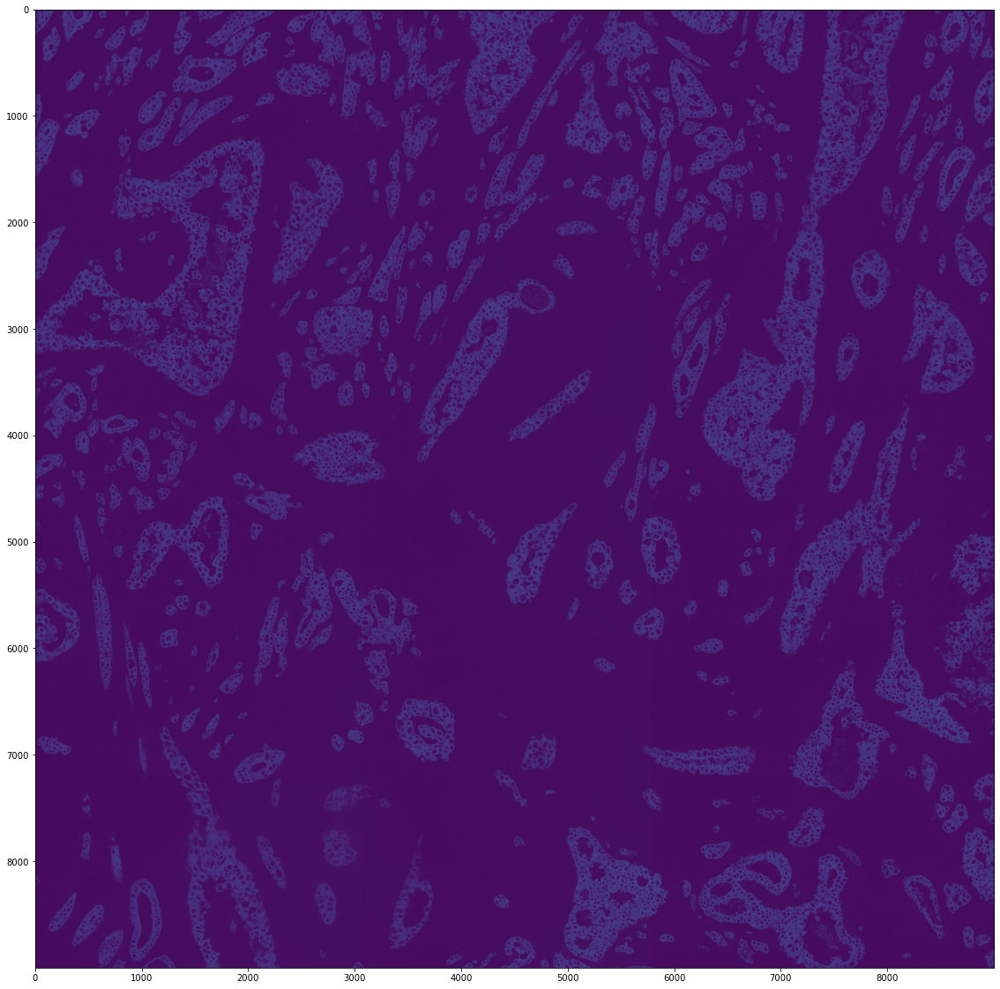

In [ ]:
plt.figure(figsize=(20, 20))
plt.imshow(source_gray)

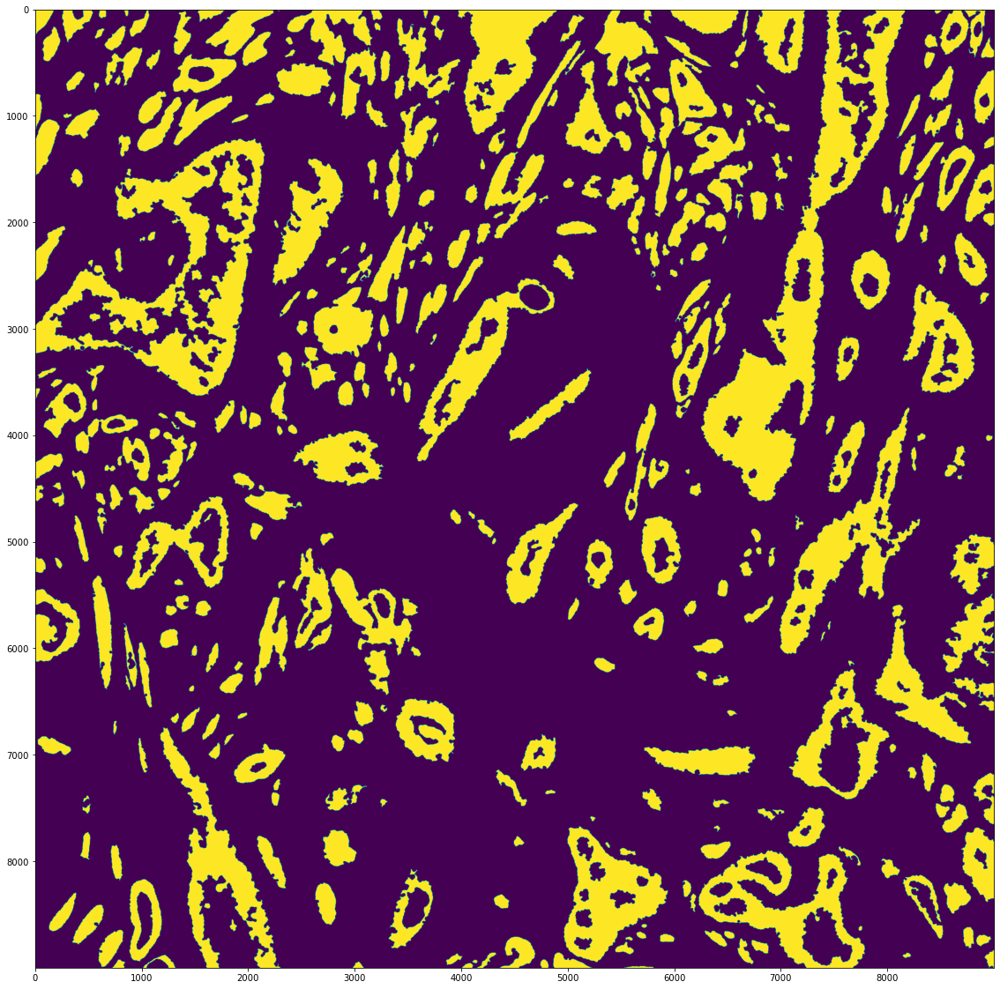

In [ ]:
plt.figure(figsize=(20, 20))
plt.imshow(mask)

In [ ]:
def get_reduced_coords(coords, angle_th, distance_th):
    vector_rep = np.diff(coords, axis=0)
    angle_th_rad = np.deg2rad(angle_th)
    points_removed = [0]
    while len(points_removed):
        points_removed = list()
        for i in range(len(vector_rep)-1):
            if len(coords) - len(points_removed) == 3:
                break
            v01 = vector_rep[i]
            v12 = vector_rep[i+1]
            d01 = np.linalg.norm(v01)
            d12 = np.linalg.norm(v12)
            if d01 < distance_th and d12 < distance_th:
                points_removed.append(i+1)
                vector_rep[i+1] = coords[i+2]-coords[i]
                continue
            angle = np.arccos(np.dot(v01, v12) / (d01 * d12))
            if angle < angle_th_rad:
                points_removed.append(i+1)
                vector_rep[i+1] = coords[i+2]-coords[i]
        coords = np.delete(coords, points_removed, axis=0)
        vector_rep = np.diff(coords, axis=0)
    return coords.astype(int)

In [ ]:
def reduce_polygon(polygon, angle_th=0, distance_th=0):
    ext_poly_coords = get_reduced_coords(
        np.array(polygon.exterior.coords[:]), angle_th, distance_th
    )
    interior_coords = [
        get_reduced_coords(np.array(interior.coords[:]), angle_th, distance_th)
        for interior in polygon.interiors
    ]
    return shapely.geometry.Polygon(ext_poly_coords, interior_coords)

In [ ]:
def mask_to_polygons_layer(mask):
    all_polygons = []
    for shape, value in features.shapes(mask.astype(np.int16), mask=(mask >0)):
        all_polygons.append(reduce_polygon(shapely.geometry.shape(shape), angle_th=1, distance_th=1))

    all_polygons = shapely.geometry.MultiPolygon(all_polygons)
    if not all_polygons.is_valid:
        all_polygons = all_polygons.buffer(0)
        # Sometimes buffer() converts a simple Multipolygon to just a Polygon,
        # need to keep it a Multi throughout
        if all_polygons.type == 'Polygon':
            all_polygons = shapely.geometry.MultiPolygon([all_polygons])
    return all_polygons

In [ ]:
polygons = mask_to_polygons_layer(mask)

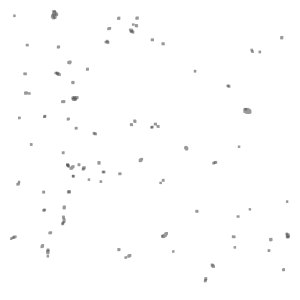

In [ ]:
polygons

In [ ]:
from cytomine import Cytomine
from cytomine.models import Property, Annotation, AnnotationTerm, AnnotationCollection, ImageInstance

In [ ]:
import json

In [ ]:
with open("/data/DeepLearning/SCHWOB_Robin/APRIORICS-prelim/hovernet_res/json/CF_APRIORICS-prelim_0001-01-HE.json", "r") as f:
    d = json.load(f)

In [ ]:
polygons = []
for k in d["nuc"]:
    x, y = d["nuc"][k]["centroid"]
    point = shapely.geometry.Point(x, y)
    polygons.append(point)
polygons = shapely.geometry.MultiPoint(polygons)

In [ ]:
slide = OpenSlide(str(data/"slides/CF_APRIORICS-prelim_0001-01-HE.mrxs"))
w, h = slide.dimensions

In [ ]:
points = affine_transform(points, [1, 0, 0, -1, 0, h])

In [ ]:
slide = OpenSlide(str(data/"slides/21T035390-03_HE.svs"))
w, h = slide.dimensions

In [ ]:
x, y = 42000, 45000

In [ ]:
moved_polygons = affine_transform(polygons, [1, 0, 0, -1, 0, h])

In [ ]:
all_polygons[x, y] = moved_polygons

In [ ]:
full_polygons = unary_union(all_polygons.values())

In [ ]:
from pathaia.patches import apply_slide_filters

In [ ]:
thumb = np.array(slide.get_thumbnail((3000, 3000)).convert("RGB"))

In [ ]:
mask = apply_slide_filters(thumb, ["full"])

In [ ]:
with Cytomine(host=host, public_key=public_key, private_key=private_key) as cytomine:
    annotations = AnnotationCollection()
    for polygon in unary_union(moved_polygons):
        annotations.append(Annotation(location=polygon.wkt, id_image=2507577, id_project=1366))
    annotations.save()

[2021-11-04 15:57:21,614][INFO] [GET] [currentuser] CURRENT USER - 61 : admin | 200 OK
[2021-11-04 15:57:22,670][INFO] [POST] userannotations 2815478,2815513,2815541,2815623,2815695,2815730 added | 200 OK
[2021-11-04 15:57:23,477][INFO] [POST] userannotations 2815480,2815493,2815520,2815626,2815674,2815702,2815744,2815784,2815805,2815819,2815868,2815931,2815975,2816008,2816036 added | 200 OK
[2021-11-04 15:57:23,655][INFO] [POST] userannotations 2815489,2815534,2815559,2815592,2815646,2815688,2815751,2815777,2815821,2815875,2815917,2815938,2815994,2816038,2816097 added | 200 OK
[2021-11-04 15:57:23,913][INFO] [POST] userannotations 2815487,2815527,2815547,2815627,2815681,2815735,2815812,2815861,2815909,2815985,2816001,2816090,2816125,2816157,2816201 added | 200 OK
[2021-11-04 15:57:24,237][INFO] [POST] userannotations 2815505,2815555,2815591,2815672,2815765,2815847,2815910,2815952,2816015,2816071,2816111,2816176,2816219,2816247,2816275 added | 200 OK
[2021-11-04 15:57:24,276][INFO] [PO

In [ ]:
%%capture
with Cytomine(host=host, public_key=public_key, private_key=private_key) as cytomine:
    annotations = AnnotationCollection()
    annotations.image = 2507577
    annotations.fetch()
    for annotation in annotations:
        annotation.delete()

In [ ]:
contour = find_boundaries(mask)

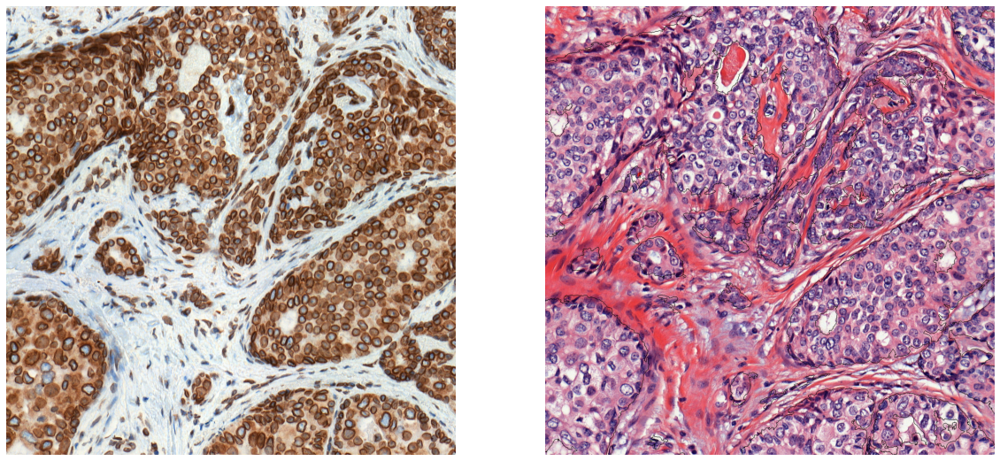

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(20, 20))
for im, ax in zip((source[:2000, :2000], (target*(~contour[:, :, None]))[:2000, :2000]), axs.flatten()):
    ax.axis("off")
    ax.imshow(im)

In [ ]:
import numpy.ma as ma
from skimage.segmentation import watershed

In [ ]:
masked_source_gray = ma.masked_array(source_gray, ~mask)

In [ ]:
thr = threshold_otsu(masked_source_gray)
mask2 = masked_source_gray < thr

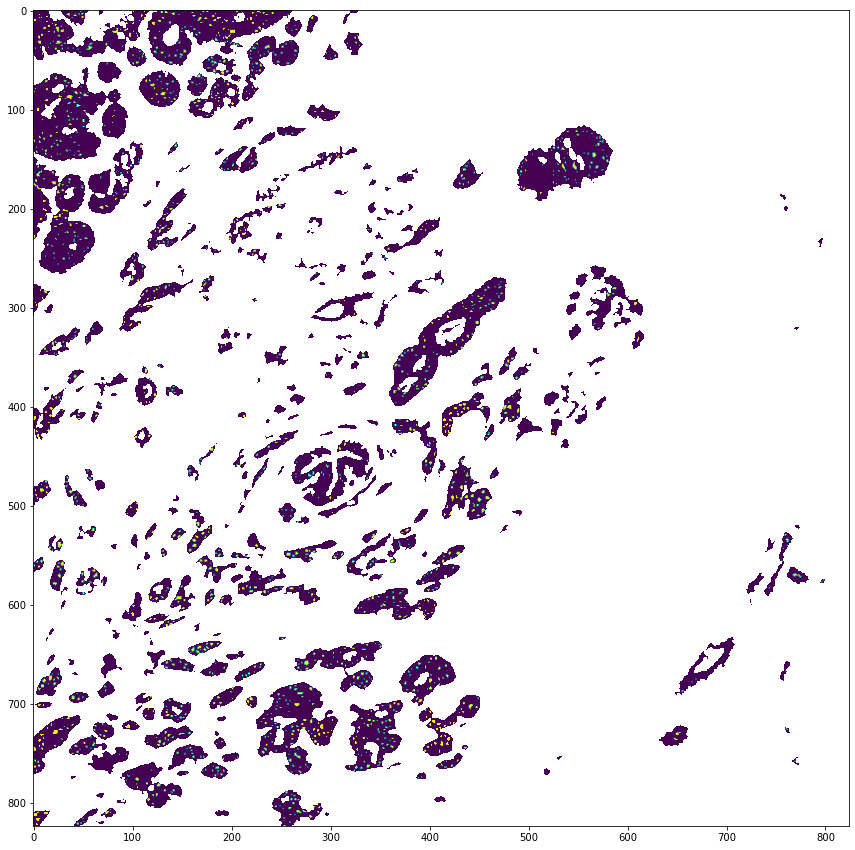

In [ ]:
plt.figure(figsize=(15, 15))
plt.imshow(mask2)

In [ ]:
from skimage.measure import label

In [ ]:
labels = label(mask2, background=0)

In [ ]:
centroids = []
for i in range(1, labels.max()+1):
    coords = np.argwhere(labels==i).mean(0).round()
    centroids.append(coords)

In [ ]:
labels.shape

(824, 824)

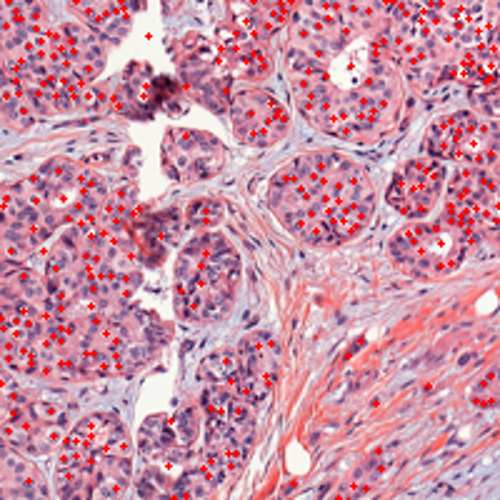

In [ ]:
img = he.crop((100, 100, 924, 924))
draw = ImageDraw.Draw(img)

for i, j in centroids:
    draw.ellipse([j-1, i-1, j+1, i+1], fill="red", width=1)

img.crop((0, 0, 200, 200)).resize((500, 500))